# Przetwarzanie wstępne. Filtracja kontekstowa.


### Cel:
- zapoznanie z pojęciem kontekstu / filtracji kontekstowej,
- zapoznanie z pojęciem konwolucji (splotu),
- zapoznanie z wybranymi filtrami:
	- filtry liniowe dolnoprzepustowe:
		- filtr uśredniający,
		- filtr Gaussa.
	- filtry nielinowe:
		- mediana,
		- mediana dla obrazów kolorowych.
	- filtry liniowe górnoprzepustowe:
			- laplasjan,
			- operator Robersta, Prewitta, Sobela.
- zadanie domowe: adaptacyjna filtracja medianowa.

### Filtry liniowe uśredniające (dolnoprzepustowe)

Jest to podstawowa rodzina filtrów stosowana w cyfrowym przetwarzaniu obrazów. 
Wykorzystuje się je w celu "rozmazania" obrazu i tym samym redukcji szumów (zakłóceń) na obrazie.
Filtr określony jest przez dwa parametry: rozmiar maski (ang. _kernel_) oraz wartości współczynników maski.

Warto zwrócić uwagę, że omawiane w niniejszym rozdziale operacje generują nową wartość piksela na podstawie pewnego fragmentu obrazu (tj. kontekstu), a nie jak operacje punktowe tylko na podstawie jednego piksela.


1. Wczytaj obraz _plansza.png_.
W dalszej części ćwiczenia sprawdzenie działania filtracji dla innych obrazów sprowadzi się do wczytania innego pliku.

2. Podstawowa funkcja to `cv2.filter2D`  - realizacja filtracji konwolucyjnej.
   Proszę sprawdzić jej dokumentację i zwrócić uwagę na obsługę problemu brzegowego (na krawędziach istnieją piksele dla których nie da się wyznaczyć otoczenia).

  Uwaga. Problem ten można też rozwiązać z użyciem funkcji `signal.convolve2d` z biblioteki _scipy_ (`from scipy import signal`).

3. Stwórz podstawowy filtr uśredniający o rozmiarze $3 \times 3$ -- za pomocą funkcji `np.ones`. Wykonaj konwolucję na wczytanym obrazie. Na wspólnym rysunku wyświetl obraz oryginalny, po filtracji oraz moduł z różnicy.

4. Przeanalizuj otrzymane wyniki. Jakie elementy zawiera obraz "moduł z różnicy"? Co na tej podstawie można powiedzieć o filtracji dolnoprzepustowej?

(-0.5, 499.5, 499.5, -0.5)

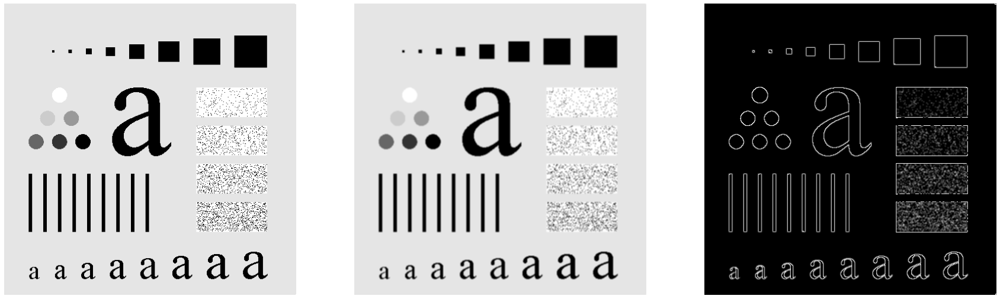

In [26]:
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
from scipy import signal


# Obrazki
if not os.path.exists("jet.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/jet.png --no-check-certificate
if not os.path.exists("kw.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/kw.png --no-check-certificate
if not os.path.exists("moon.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/moon.png --no-check-certificate
if not os.path.exists("lenaSzum.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/lenaSzum.png --no-check-certificate
if not os.path.exists("lena.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/lena.png --no-check-certificate
if not os.path.exists("plansza.png") :
    !wget https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/plansza.png --no-check-certificate


        
image = cv2.imread('plansza.png')
mask = np.ones((3,3),np.float32)/9

image_after = cv2.filter2D(image, -1, mask)

diff= abs(image - image_after)
    
          
f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(30,30))
plt.gray()
ax1.axis('off')
ax1.imshow(image)

ax2.imshow(image_after)
ax2.axis('off')

ax3.imshow(diff)
ax3.axis('off')

# Jakie elementy zawiera obraz "moduł z różnicy"? Co na tej podstawie można powiedzieć o filtracji dolnoprzepustowej?
# jeśli odejmiemy od siebie dwa takie same piksele o takich samych wartosciach otrzymamy kolor czarny tzn 0
# jeśli odejmiemy od siebie dwa te same piksele, ale o różnych wartościach to w ich miejsach powstanie jakaś wartość != 0 
# z tego wynika że różnica między obrazami odbywa się na krawędziach, ponieważ tam dochodzi do rozmwycia,
# dlatego odejmując obrazy od siebie w miejsach rozmyć, wartość otrzymanej różnicy piksela > 0 stąd te biało/szare ramki  (ponieważ starszy piksel ma inną wartość niż nowy którego "dosięgło" rozmycie)

5. Na wspólnym rysunku wyświetl wyniki filtracji uśredniającej z oknem o rozmiarze 3, 5, 9, 15 i 35. 
Wykorzystaj polecenie `plt.subplot`. 
Przeanalizuj wpływ rozmiaru maski na wynik. 

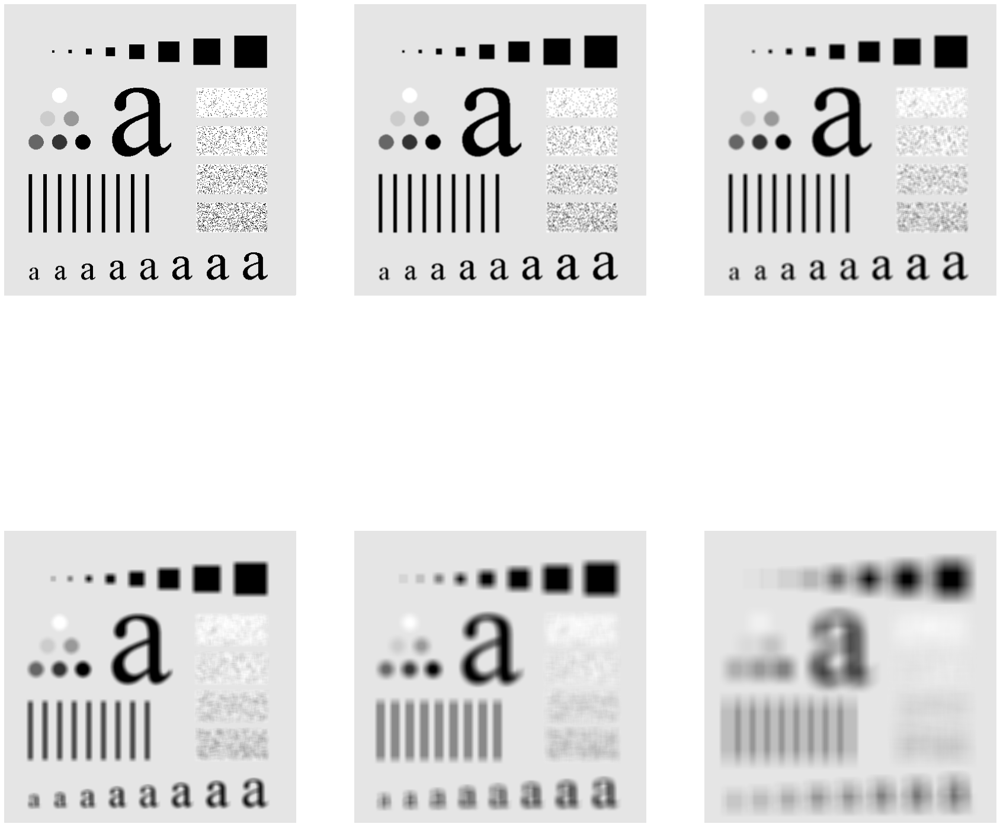

In [18]:
mask = np.ones((3,3),np.float32)/9
image_after_3 = cv2.filter2D(image, -1, mask)

mask = np.ones((5,5),np.float32)/25
image_after_5 = cv2.filter2D(image, -1, mask)

mask = np.ones((9,9),np.float32)/81
image_after_9 = cv2.filter2D(image, -1, mask)

mask = np.ones((15,15),np.float32)/(15*15)
image_after_15 = cv2.filter2D(image, -1, mask)

mask = np.ones((35,35),np.float32)/(35*35)
image_after_35 = cv2.filter2D(image, -1, mask)


    
          
f, tab = plt.subplots(2,3, figsize=(30,30))

for i in range (len(tab)):
    for j in range(len(tab[i])):
        tab[i,j].axis('off')
    
    
tab[0,0].imshow(image)
tab[0,1].imshow(image_after_3)
tab[0,2].imshow(image_after_5)

tab[1,0].imshow(image_after_9)
tab[1,1].imshow(image_after_15)
tab[1,2].imshow(image_after_35)


6. Wczytaj obraz _lena.png_.
Zaobserwuj efekty filtracji dolnoprzepustowej dla obrazu rzeczywistego.

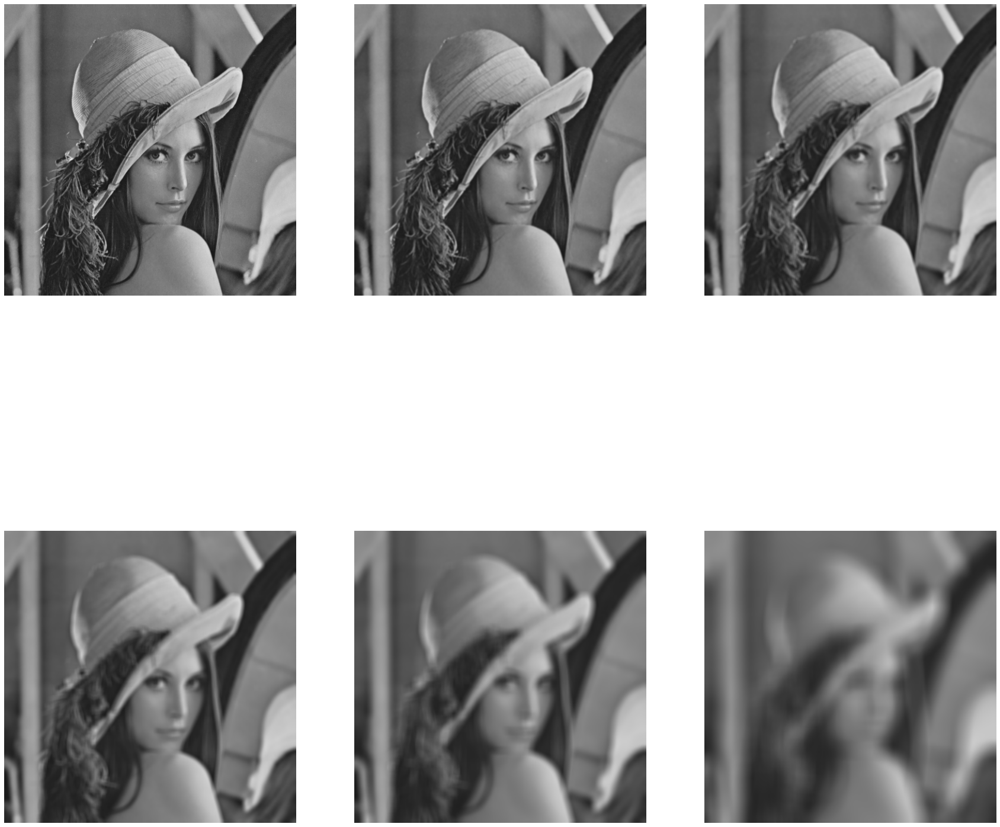

In [21]:
lena = cv2.imread('lena.png')

mask = np.ones((3,3),np.float32)/9
lena_after_3 = cv2.filter2D(lena, -1, mask)

mask = np.ones((5,5),np.float32)/25
lena_after_5 = cv2.filter2D(lena, -1, mask)

mask = np.ones((9,9),np.float32)/81
lena_after_9 = cv2.filter2D(lena, -1, mask)

mask = np.ones((15,15),np.float32)/(15*15)
lena_after_15 = cv2.filter2D(lena, -1, mask)

mask = np.ones((35,35),np.float32)/(35*35)
lena_after_35 = cv2.filter2D(lena, -1, mask)


    
          
f, tab = plt.subplots(2,3, figsize=(30,30))

for i in range (len(tab)):
    for j in range(len(tab[i])):
        tab[i,j].axis('off')
    
    
tab[0,0].imshow(lena)
tab[0,1].imshow(lena_after_3)
tab[0,2].imshow(lena_after_5)

tab[1,0].imshow(lena_after_9)
tab[1,1].imshow(lena_after_15)
tab[1,2].imshow(lena_after_35)

7. Niekorzystny efekt towarzyszący wykonanym filtracjom dolnoprzepustowym to utrata ostrości. 
Częściowo można go zniwelować poprzez odpowiedni dobór maski. 
Wykorzystaj maskę:  `M = np.array([1 2 1; 2 4 2; 1 2 1])`. 
Przed obliczeniami należy jeszcze wykonać normalizację - podzielić każdy element maski przez sumę wszystkich elementów: `M = M/sum(sum(M));`.
Tak przygotowaną maskę wykorzystaj w konwolucji - wyświetl wyniki tak jak wcześniej.
Możliwe jest też wykorzystywanie innych masek - współczynniki można dopasowywać do konkretnego problemu.

(-0.5, 511.5, 511.5, -0.5)

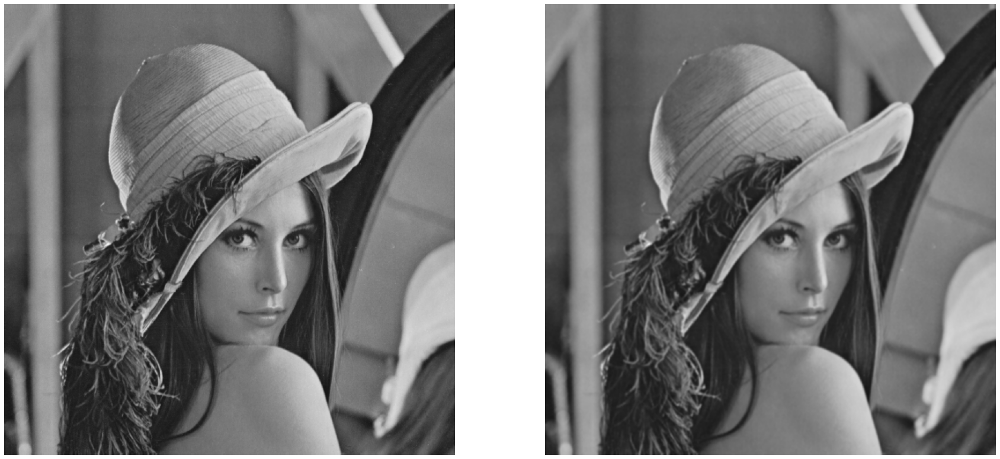

In [24]:
M = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])
M = M/sum(sum(M))

image_after = cv2.filter2D(image,-1,M)

f, (ax1, ax2) = plt.subplots(1,2, figsize=(30,30))
plt.gray()
ax1.axis('off')
ax1.imshow(image)

ax2.imshow(image_after)
ax2.axis('off')



8. Skuteczną i często wykorzystywaną maską jest tzw. maska Gasussa.
Jest to zbiór liczb, które aproksymują dwuwymiarowy rozkład Gaussa. 
Parametrem jest odchylenie standardowe i rozmiar maski.

9. Wykorzystując przygotowaną funkcję `fgaussian` stwórz maskę o rozmiarze $5 \times 5$ i odchyleniu standardowym 0.5.
  Wykorzystując funkcję `mesh` zwizualizuj filtr.
  Sprawdź jak parametr ``odchylenie standardowe'' wpływa na ``kształt'' filtru.

  Uwaga. W OpenCV dostępna jest *dedykowana* funkcja do filtracji Gaussa - `GaussianBlur`.
  Proszę na jednym przykładzie porównać jej działanie z użytym wyżej rozwiązaniem.

10. Wykonaj filtrację dla wybranych (2--3) wartości odchylenia standardowego.


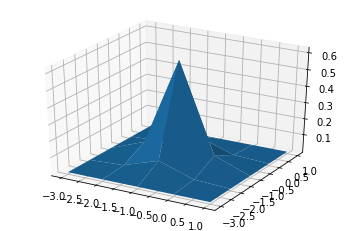

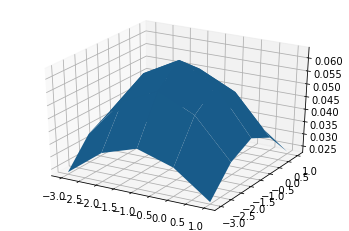

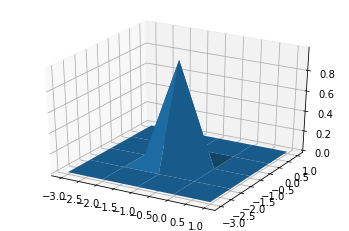

In [32]:
def fgaussian(size, sigma):
     m = n = size
     h, k = m//2, n//2
     x, y = np.mgrid[-h:h+1, -k:k+1]
     g = np.exp(-(x**2 + y**2)/(2*sigma**2))
     return g /g.sum() 
    
    
def mesh(fun, size):
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    

    X = np.arange(-size//2, size//2, 1)
    Y = np.arange(-size//2, size//2, 1)
    X, Y = np.meshgrid(X, Y)
    Z = fun
    
    ax.plot_surface(X, Y, Z)
    
    plt.show()

mask1 = fgaussian(5,0.5)
mesh(mask1,5)

mask2 = fgaussian(5,2)
mesh(mask2,5)

mask3 = fgaussian(5,0.2)
mesh(mask3,5)





Text(0.5, 1.0, 'GausianBlurr')

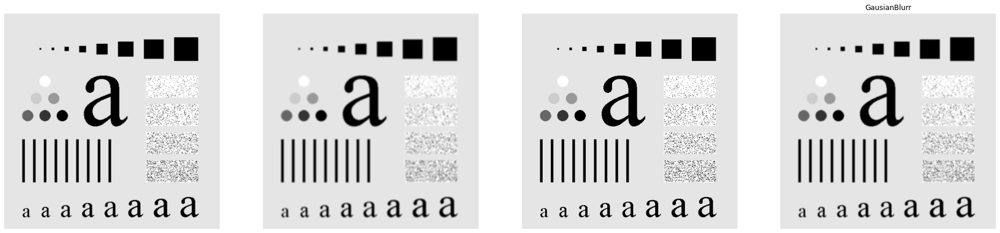

In [37]:
f, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(30,30)) 

ax1.imshow(cv2.filter2D(image, -1, mask1))
ax1.axis('off')
ax2.imshow(cv2.filter2D(image, -1, mask2))
ax2.axis('off')
ax3.imshow(cv2.filter2D(image, -1, mask3))
ax3.axis('off')
ax4.imshow(cv2.GaussianBlur(image,(5,5),0))
ax4.axis('off')
ax4.set_title("GausianBlurr")

### Filtry nieliniowe -- mediana

Filtry rozmywające redukują szum, ale niekorzystnie wpływają na ostrość obrazu.
Dlatego często wykorzystuje się filtry nieliniowe - np. filtr medianowy (dla przypomnienia: mediana - środkowa wartość w posortowanym ciągu liczb).

Podstawowa różnica pomiędzy filtrami liniowymi, a nieliniowymi polega na tym, że przy filtracji liniowej na nową wartość piksela ma wpływ wartość wszystkich pikseli z otoczenia (np. uśrednianie, czasem ważone), natomiast w przypadku filtracji nieliniowej jako nowy piksel wybierana jest któraś z wartości otoczenia - według jakiegoś wskaźnika (wartość największa, najmniejsza czy właśnie mediana).


1. Wczytaj obraz _lenaSzum.png_ (losowe 10% pikseli białych lub czarnych - tzw. zakłócenia impulsowe). Przeprowadź filtrację uśredniającą z rozmiarem maski 3x3. Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Wykorzystując funkcję ``cv2.medianBlur` wykonaj filtrację medianową _lenaSzum.png_ (z rozmiarem maski $3 \times 3$). Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Która filtracja lepiej radzi sobie z tego typu szumem?

  Uwaga. Taki sam efekt da również użycie funkcji `signal.medfilt2d`.


<Figure size 432x288 with 0 Axes>

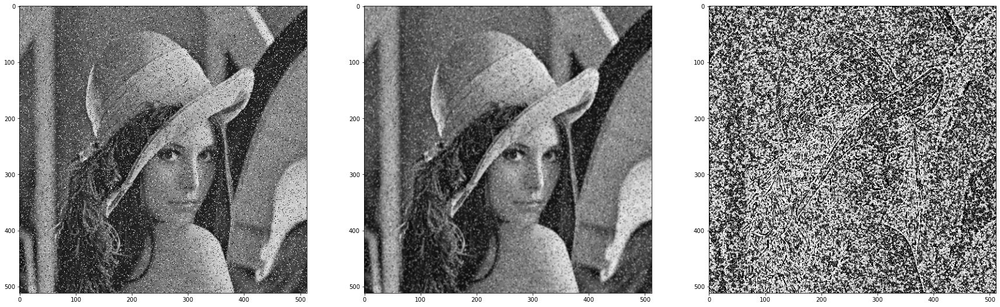

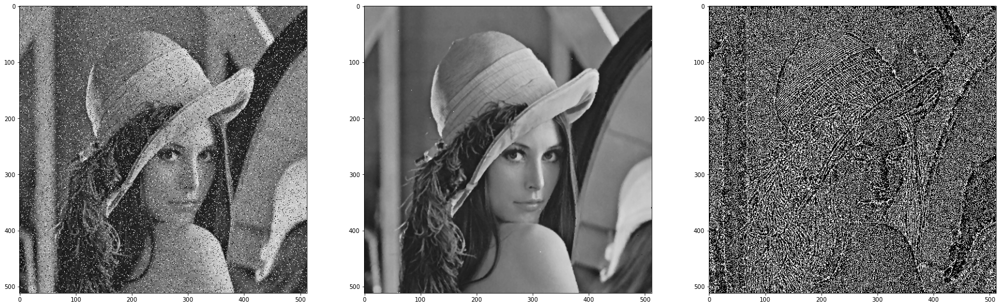

In [40]:
lena_szum = cv2.imread('lenaSzum.png')           
lena_szum = cv2.cvtColor(lena_szum, cv2.COLOR_BGR2GRAY)
plt.gray()

mask = np.ones((3,3),np.float32)/9
lena_szum_after= cv2.filter2D(lena_szum,-1, mask)

diff= abs(lena_szum-lena_szum_after)

f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(30,30)) 
ax1.imshow(lena_szum)
ax2.imshow(lena_szum_after)
ax3.imshow(diff)

lena_szum_median=cv2.medianBlur(lena_szum,3)
diff_median= abs(lena_szum-lena_szum_median)

g, (bx1, bx2, bx3) = plt.subplots(1,3, figsize=(30,30)) 
bx1.imshow(lena_szum)
bx2.imshow(lena_szum_median)
bx3.imshow(diff_median)


2. Przeprowadź filtrację uśredniającą, a następnie medianową obrazu _lena.png_.
   Wyniki porównaj - dla obu wyświetl: oryginał, wynik filtracji i moduł z różnicy.
   Szczególną uwagę zwróć na ostrość i krawędzie.
   W której filtracji krawędzie zostają lepiej zachowane?

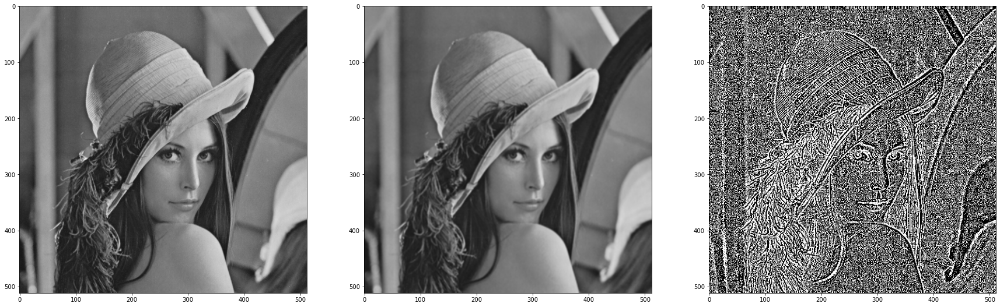

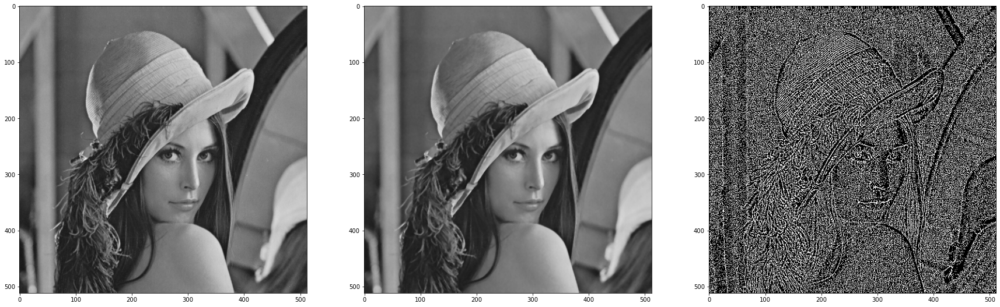

In [44]:
lena= cv2.imread('lena.png')   

mask = np.ones((3,3),np.float32)/9
lena_after= cv2.filter2D(lena,-1, mask)

diff= abs(lena-lena_after)

f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(30,30)) 
ax1.imshow(lena)
ax2.imshow(lena_after)
ax3.imshow(diff)

lena_median=cv2.medianBlur(lena,3)
diff_median= abs(lena-lena_median)

g, (bx1, bx2, bx3) = plt.subplots(1,3, figsize=(30,30)) 
bx1.imshow(lena)
bx2.imshow(lena_median)
bx3.imshow(diff_median)

3. Ciekawy efekt można uzyskać wykonując filtrację medianową wielokrotnie. Określa się go mianem  posteryzacji.  W wyniku przetwarzania z obrazka usunięte zostają detale, a duże obszary uzyskują tą samą wartość jasności.  Wykonaj operację mediany $5 \times 5$ na obrazie _lena.png_ 10-krotnie. (wykorzystaj np. pętlę `for`).


Inne filtry nieliniowe:
- filtr modowy - moda (dominanta) zamiast mediany,
- filtr olimpijski - średnia z podzbioru otoczenia (bez wartości ekstremalnych),
- hybrydowy filtr medianowy - mediana obliczana osobno w różnych podzbiorach otoczenia (np. kształt ``x'',``+''), a jako wynik brana jest mediana ze zbioru wartość elementu centralnego, mediana z ``x'' i mediana z ``+'',
- filtr minimalny i maksymalny (będą omówione przy okazji operacji morfologicznych w dalszej części kursu).


Warto zdawać sobie sprawę, z szerokich możliwości dopasowywania rodzaju filtracji do konkretnego rozważanego problemu i rodzaju zaszumienia występującego na obrazie.

<Figure size 432x288 with 0 Axes>

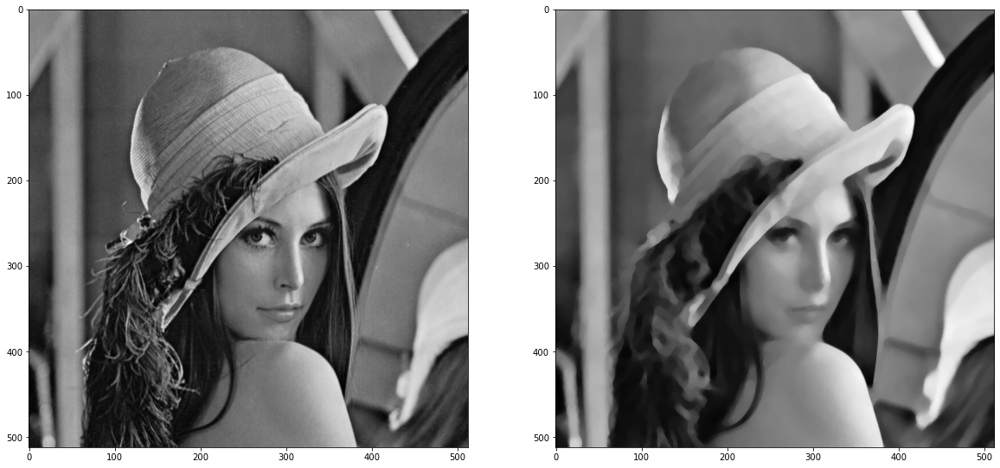

In [46]:
lena = cv2.imread('lena.png')           
lena = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY)
plt.gray()

lena_loop=lena
for i in range (10):
    new_lena = cv2.medianBlur(lena_loop,5)
    lena_loop = new_lena

f, (ax1, ax2) = plt.subplots(1,2, figsize=(20,20)) 
ax1.imshow(lena)
ax2.imshow(new_lena)

## Filtry liniowe górnoprzepustowe (wyostrzające, wykrywające krawędzie)

Zadaniem filtrów górnoprzepustowych jest wydobywanie z obrazu składników odpowiedzialnych za szybkie zmiany jasności - konturów, krawędzi, drobnych elementów tekstury.

### Laplasjan (wykorzystanie drugiej pochodnej obrazu)

1. Wczytaj obraz _moon.png_.

2. Wprowadź podstawową maskę laplasjanu:
\begin{equation}
M = 
\begin{bmatrix}
0 & 1& 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0
\end{bmatrix}
\end{equation}

3. Przed rozpoczęciem obliczeń należy dokonać normalizacji maski - dla rozmiaru $3 \times 3$ podzielić każdy element przez 9.
   Proszę zwrócić uwagę, że nie można tu zastosować takiej samej normalizacji, jak dla filtrów dolnoprzepustowanych, gdyż skutkowałby to dzieleniem przez 0.

4. Wykonaj konwolucję obrazu z maską (`c2.filter2D`). Przed wyświetleniem, wynikowy obraz należy poddać normalizacji (występują ujemne wartości). Najczęściej wykonuje się jedną z dwóch operacji:
- skalowanie (np. poprzez dodatnie 128 do każdego z pikseli),
- moduł (wartość bezwzględna).

Wykonaj obie normalizacje. 
Na wspólnym wykresie wyświetl obraz oryginalny oraz przefiltrowany po obu normalizacjach. 

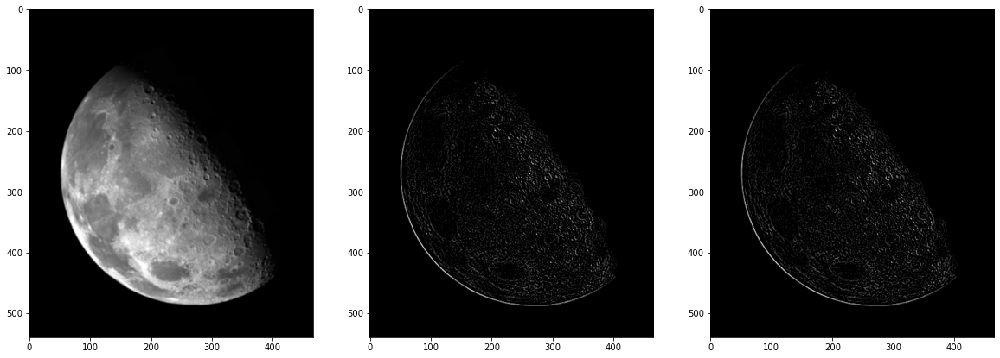

In [49]:
moon= cv2.imread('moon.png')           
moon = cv2.cvtColor(moon, cv2.COLOR_BGR2GRAY)

M = np.array([[0, 1, 0],
              [1, -4 ,1],
              [0 ,1 ,0]])
M = M/9

moon_after = cv2.filter2D(moon, -1, M)

f, (ax1, ax2,ax3) = plt.subplots(1,3, figsize=(20,20)) 
ax1.imshow(moon)

moon_norm=np.zeros(moon.shape)
X,Y =moon.shape
for i in range(X):
    for j  in range(Y):
        moon_norm[i,j]=moon_after[i,j] + 128
        
ax2.imshow(moon_norm)
ax3.imshow(abs(moon_after))

7. Efekt wyostrzenia uzyskuje się po odjęciu/dodaniu (zależy do maski) rezultatu filtracji laplasjanowej i oryginalnego obrazu. Wyświetl na jednym wykresie: obraz oryginalny, sumę oryginału i wyniku filtracji oraz różnicę (bezwzględną) oryginału i wyniku filtracji.
 Uwaga. Aby uniknąć artefaktów, należy obraz wejściowy przekonwertować do formatu ze znakiem.



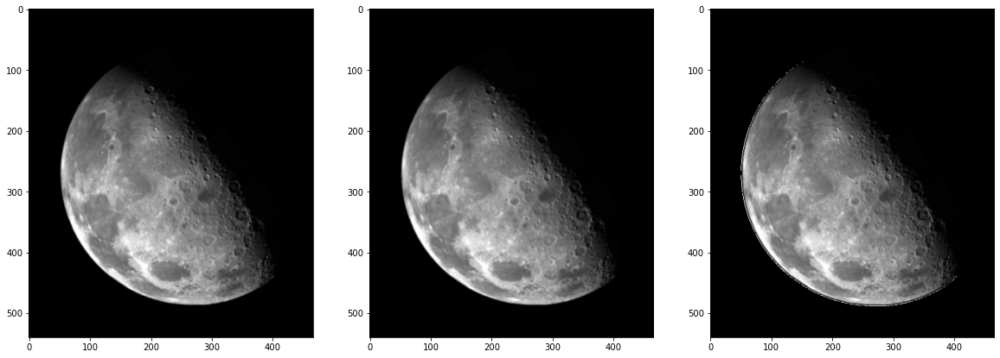

In [50]:
f, (ax1, ax2,ax3) = plt.subplots(1,3, figsize=(20,20)) 

ax1.imshow(moon)
ax2.imshow(moon + moon_after)
ax3.imshow(abs(moon - moon_after))

### Gradienty (wykorzystanie pierwszej pochodnej obrazu)

1. Wczytaj obraz _kw.png_. Stwórz odpowiednie maski opisane w kolejnych punktach i dokonaj filtracji.
2. Wykorzystując gradient Robertsa przeprowadź detekcję krawędzi - poprzez wykonanie konwolucji obrazu z daną maską:
\begin{equation}
R1 = \begin{bmatrix} 0 & 0 & 0 \\ -1 & 0 & 0 \\ 0 & 1 & 0 \end{bmatrix}   
R2 = \begin{bmatrix} 0 & 0 & 0 \\ 0 & 0 & -1 \\ 0 & 1 & 0 \end{bmatrix}
\end{equation}

Wykorzystaj stworzony wcześniej kod (przy laplasjanie) - dwie metody normalizacji oraz sposób wyświetlania.

3. Analogicznie przeprowadź detekcję krawędzi za pomocą gradientu Prewitta (pionowy i poziomy)
\begin{equation}
P1 = \begin{bmatrix} -1 & 0 & 1 \\ -1 & 0 & 1 \\ -1 & 0 & 1 \end{bmatrix}   
P2 = \begin{bmatrix} -1 & -1 & -1 \\ 0 & 0 & 0 \\ 1 & 1 & 1 \end{bmatrix}
\end{equation}

4. Podobnie skonstruowany jest gradient Sobela (występuje osiem masek, zaprezentowane są dwie ``prostopadłe''):
\begin{equation}
S1 = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}   
S2 = \begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ 1 & 2 & 1 \end{bmatrix}
\end{equation}

Przeprowadź detekcję krawędzi za pomocą gradientu Sobela. 

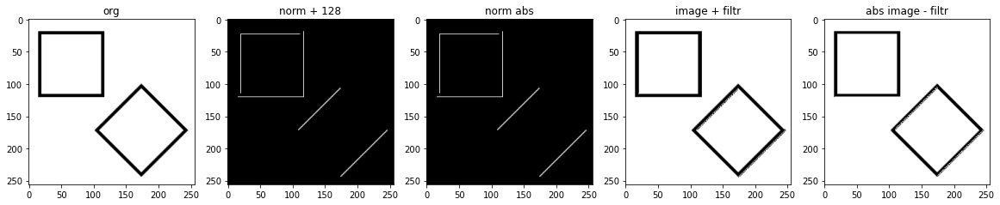

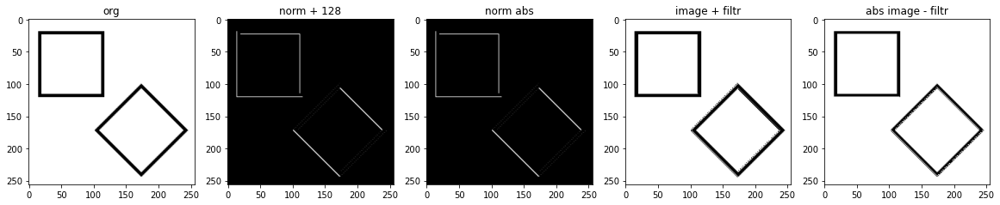

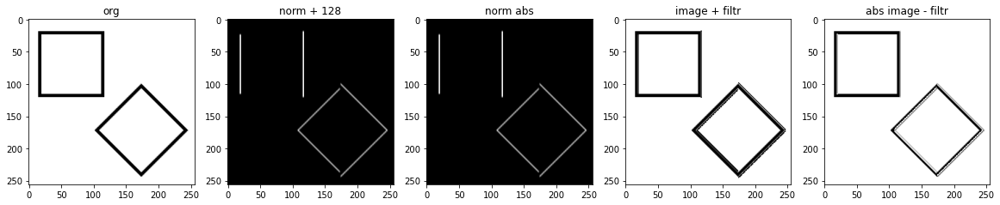

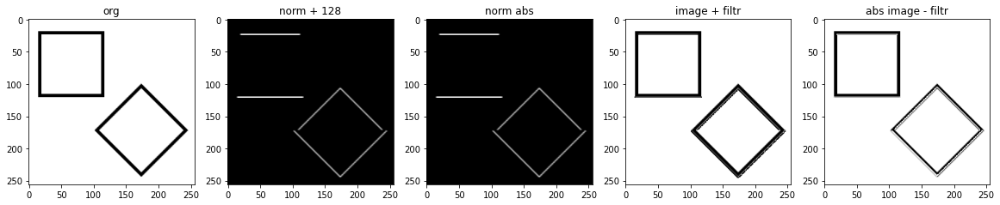

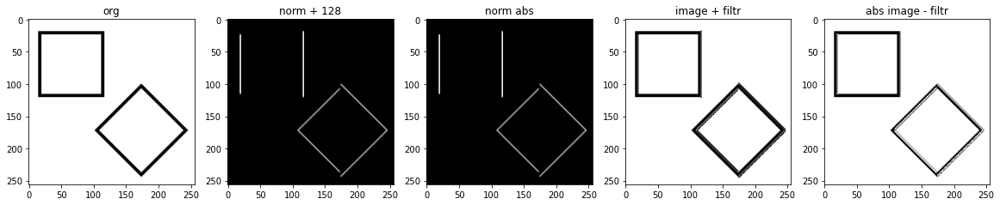

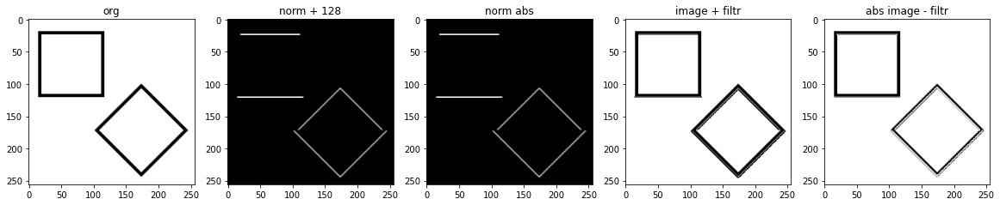

In [58]:
kw= cv2.imread('kw.png')           
kw = cv2.cvtColor(kw, cv2.COLOR_BGR2GRAY)

def calc(image, matrix):
    image_after = cv2.filter2D(image, -1, matrix)
    f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1,5, figsize=(20,20)) 
    ax1.imshow(image)
    ax1.set_title('org')

    image_norm=np.zeros(image.shape)
    X,Y = image.shape
    for i in range(X):
        for j  in range(Y):
            image_norm[i,j]=image_after[i,j] + 128

    ax2.imshow(image_norm)
    ax2.set_title('norm + 128')
    ax3.imshow(abs(image_after))
    ax3.set_title('norm abs')
    ax4.imshow(image + image_after)
    ax4.set_title('image + filtr')
    ax5.imshow(abs(image - image_after))
    ax5.set_title('abs image - filtr')

R1 = np.array([[ 0, 0, 0],
               [-1, 0, 0],
               [ 0, 1, 0]])/9

R2 = np.array([[0, 0, 0],
               [0, 0,-1],
               [0, 1, 0]])/9

P1 = np.array([[-1, 0, 1],
               [-1, 0, 1],
               [-1, 0, 1]])/9

P2 = np.array([[-1,-1,-1],
               [ 0, 0, 0],
               [ 1, 1, 1]])/9

S1 = np.array([[-1, 0, 1],
               [-2, 0, 2],
               [-1, 0, 1]])/9

S2 = np.array([[-1,-2,-1],
               [ 0, 0, 0],
               [ 1, 2, 1]])/9

calc(kw, R1)
calc(kw, R2)
calc(kw, P1)
calc(kw, P2)
calc(kw, S1)
calc(kw, S2)

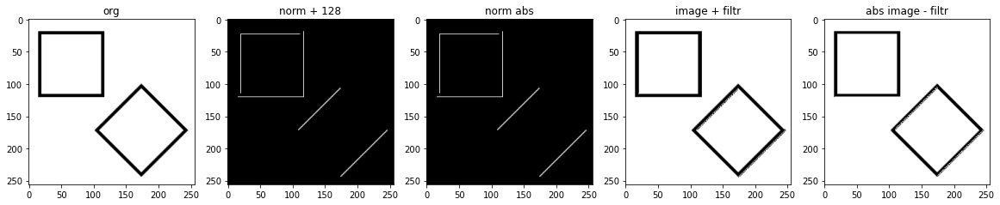

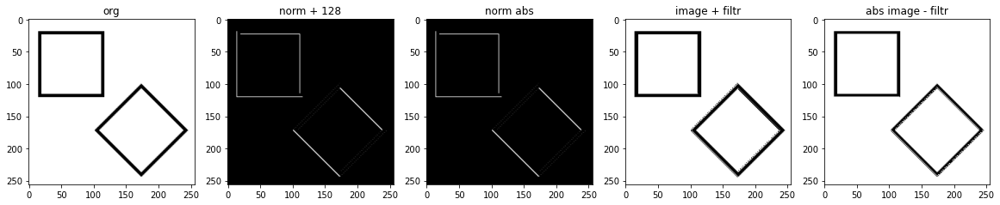

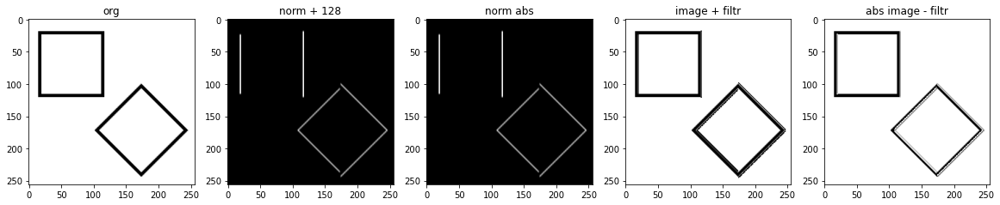

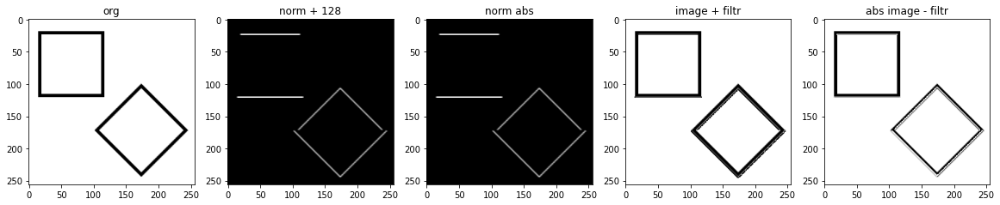

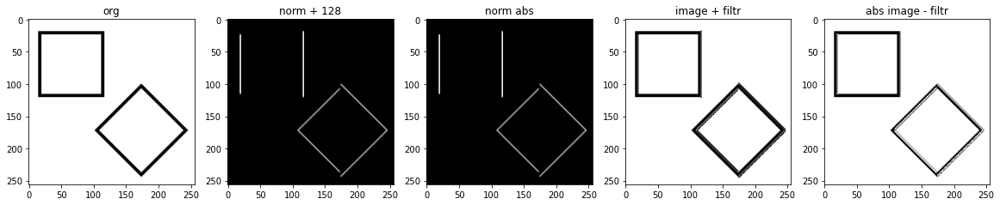

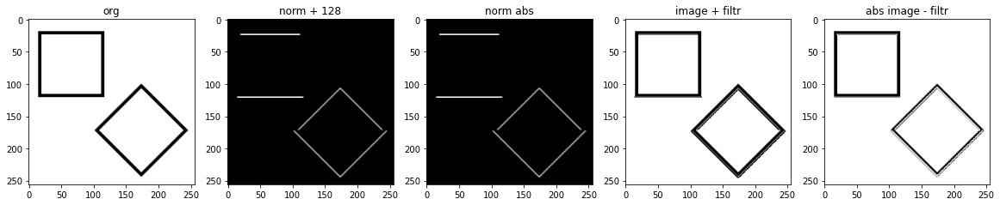

In [101]:
calc(kw, R1)
calc(kw, R2)
calc(kw, P1)
calc(kw, P2)
calc(kw, S1)
calc(kw, S2)

5. Na podstawie dwóch ortogonalnych masek np. Sobela można stworzyć tzw. filtr kombinowany - pierwiastek kwadratowy z sumy kwadratów gradientów:
\begin{equation}
OW = \sqrt{(O * S1)^2 + (O * S2)^2}
\end{equation}
gdzie:  $OW$ - obraz wyjściowy, $O$ - obraz oryginalny (wejściowy), $S1,S2$ - maski Sobela, $*$ - operacja konwolucji.

Zaimplementuj filtr kombinowany.

Uwaga. Proszę zwrócić uwagę na konieczność zmiany formatu danych obrazu wejściowego - na typ znakiem



16


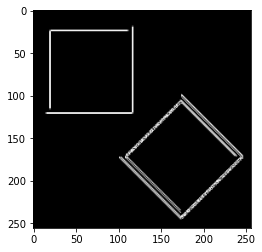

In [95]:
s1=cv2.filter2D(kw,-1,S1)**2
s2=cv2.filter2D(kw,-1,S2)**2

OW = (s1 + s2)**(0.5)
plt.imshow(OW)

6. Istnieje alternatywna wersja filtra kombinowanego, która zamiast pierwiastka z sumy kwadratów wykorzystuje sumę modułów (prostsze obliczenia). 
Zaimplementuj tę wersję. 

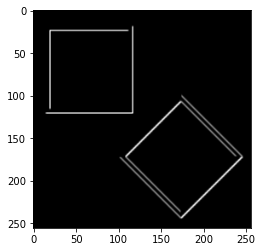

In [96]:
s1=cv2.filter2D(kw,-1,S1)
s2=cv2.filter2D(kw,-1,S2)

OW2 = (abs(s1) + abs(s2))
plt.imshow(OW2)


7. Wczytaj plik _jet.png_ (zamiast _kw.png_).
Sprawdź działanie obu wariantów filtracji kombinowanej.

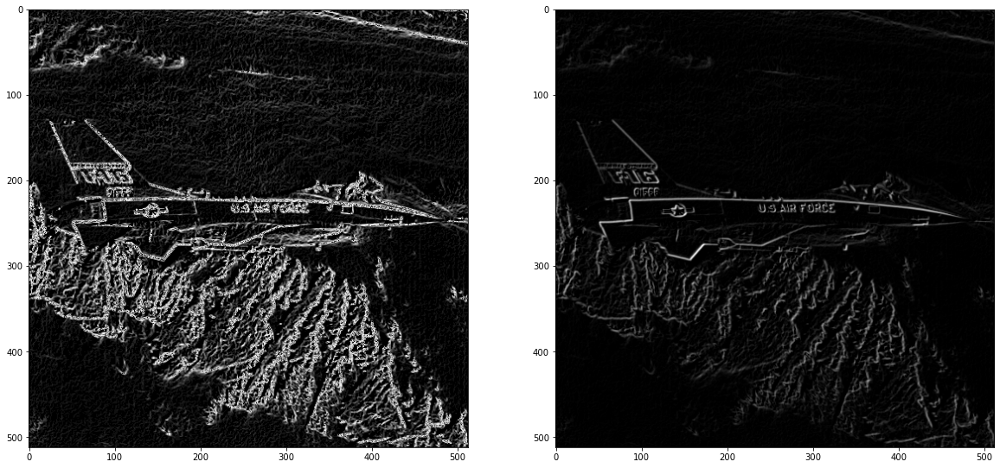

In [99]:
jet = cv2.imread('jet.png')           
jet = cv2.cvtColor(jet, cv2.COLOR_BGR2GRAY)

s1=cv2.filter2D(jet,-1,S1)**2
s2=cv2.filter2D(jet,-1,S2)**2

OW = (s1 + s2)**(0.5)

s1_=cv2.filter2D(jet,-1,S1)
s2_=cv2.filter2D(jet,-1,S2)

OW2 = (abs(s1_) + abs(s2_))


f, (ax1, ax2) = plt.subplots(1,2, figsize=(20,20)) 
ax1.imshow(OW)
ax2.imshow(OW2)